In [1]:
import numpy as np
import cv2, glob
from moviepy.editor import VideoFileClip
from IPython.display import HTML
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
def calibration_matrix(path, mx, my):
    # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objp = np.zeros((mx*my,3), np.float32)
    objp[:,:2] = np.mgrid[0:mx, 0:my].T.reshape(-1,2)

    # Arrays to store object points and image points from all the images.
    objpoints = [] # 3d points in real world space
    imgpoints = [] # 2d points in image plane.

    # Make a list of calibration images
    images = glob.glob(path + 'calibration*.jpg')
    img_size = (720,1280)
    # Step through the list and search for chessboard corners
    for idx, fname in enumerate(images):
        img = cv2.imread(fname)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        img_size = (img.shape[0], img.shape[1])
        #print(img_size)
        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (mx,my), None)

        # If found, add object points, image points
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)
    #return objpoints, imgpoints    
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)
    return mtx,dist

In [3]:
def undistort(image, mtx, dist):
    image = cv2.undistort(image, mtx, dist, None, mtx)
    return image

True

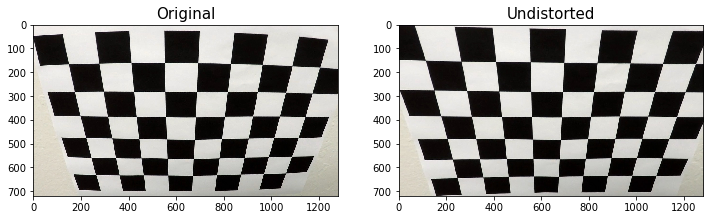

In [4]:
mtx, dist = calibration_matrix('camera_cal/', 9, 6)

checker_dist = mpimg.imread("./camera_cal/calibration2.jpg")
#ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, (720,1280),None,None)
checker_undist = undistort(checker_dist, mtx, dist)

f, ((ax1, ax2)) = plt.subplots(1, 2, figsize=(12, 18))
ax1.imshow(checker_dist)
ax1.set_title('Original', fontsize=15)
ax2.imshow(checker_undist)
ax2.set_title('Undistorted', fontsize=15)

bgr_img = cv2.cvtColor(checker_undist, cv2.COLOR_RGB2BGR)
cv2.imwrite("output_images/camera_calibration_output.jpg", bgr_img)

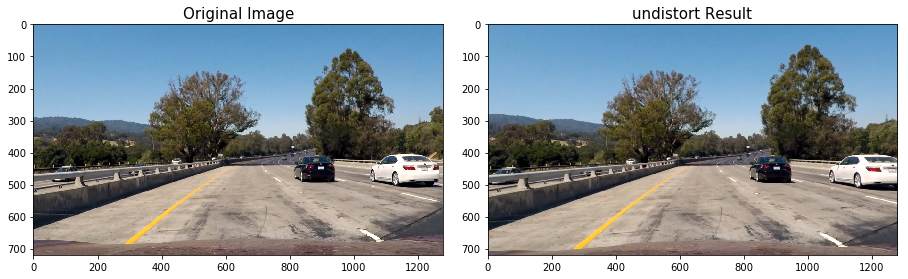

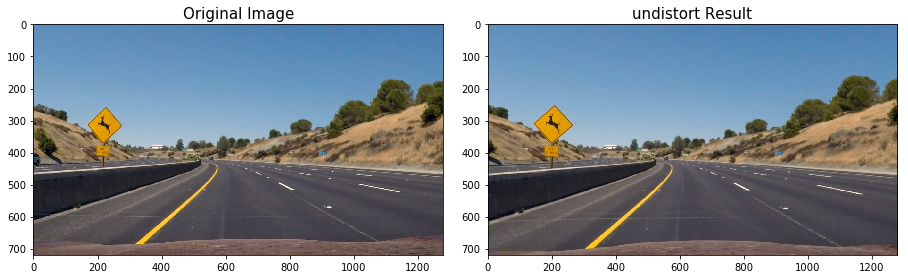

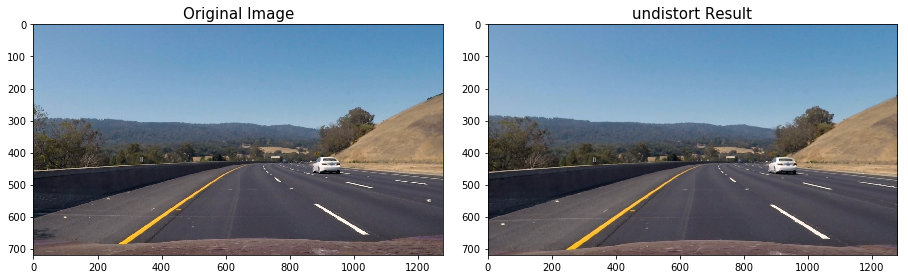

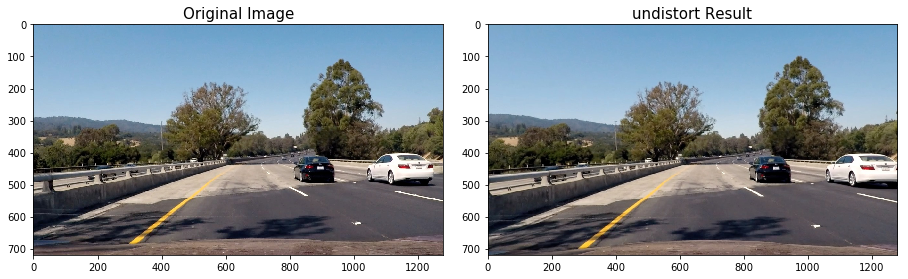

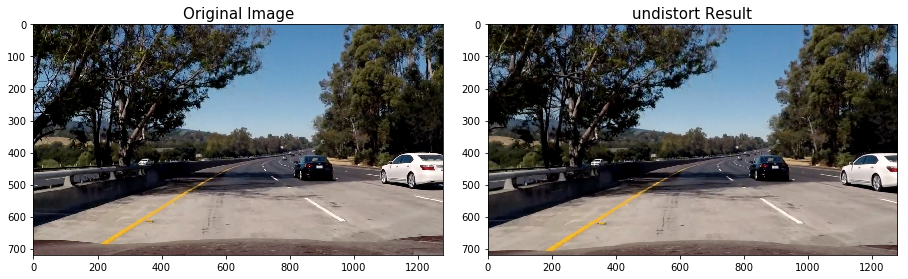

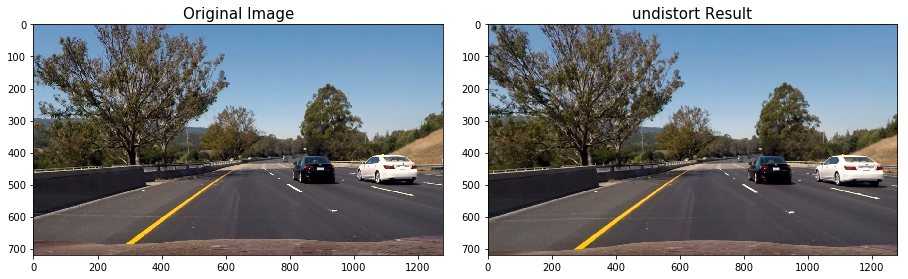

In [5]:
#mtx, dist = calibration_matrix('camera_cal/', 9, 6)
for i in range(6):
    fname = 'test_images/test{}.jpg'.format(i+1)
    image = mpimg.imread(fname)
    #test_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    test_dst = undistort(image, mtx, dist)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 18))
    f.tight_layout()
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=15)
    ax2.imshow(test_dst)
    ax2.set_title('undistort Result', fontsize=15)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    test_dst = cv2.cvtColor(test_dst, cv2.COLOR_RGB2BGR)
    cv2.imwrite("output_images/test_calibration_output{}.jpg".format(i+1), test_dst)

In [6]:
def color_transform(img, cmd = 'RGB'):
    if cmd == 'RGB':
        return img
    elif cmd == 'HSV':
        HSV = cv2.cvtColor(img, cv2.COLOR_RGB2HSV).astype("float")
        return HSV
    elif cmd == 'LUV':
        LUV = cv2.cvtColor(img, cv2.COLOR_RGB2Lab).astype("float")
        return LUV
    elif cmd == 'GRAY':
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY).astype("float")
        return gray
    elif cmd == 'HLS':
        hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype("float")
        return hls
    else:
        raise NotImplementedError

In [7]:
def gaussianblur(img, kernel_size = 7):
    img = cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)
    return img

In [8]:
def color_region(img,_min,_max):
    hls = color_transform(img, cmd = 'HLS')
    binary_output = np.zeros((img.shape[0], img.shape[1]))
    binary_output[(hls[:,:,0] >= _min[0]) & (hls[:,:,0] <= _max[0]) & 
                  (hls[:,:,1] >= _min[1])  & (hls[:,:,1] <= _max[1])& 
                  (hls[:,:,2] >= _min[2]) & (hls[:,:,2] <= _max[2])
                 ] = 1
    return binary_output

In [9]:
def binary_image(img):
    
    # Grayscale image
    gray = color_transform(img, cmd = 'GRAY')
    # Sobel x
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))

    # Threshold x gradient
    thresh_min = 20
    thresh_max = 100
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    
    # Threshold color channel
    yellow_low = np.array([0,100,100])
    yellow_high = np.array([50,255,255])
    white_low = np.array([18,0,180])
    white_high = np.array([255,80,255])
    yellow = color_region(img,yellow_low,yellow_high)
    white = color_region(img,white_low,white_high)

    s_binary =np.zeros_like(yellow)

    s_binary[(yellow==1) | (white==1)] =1
    # Stack each channel to view their individual contributions in green and blue respectively
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary))

    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1
    
    return combined_binary, color_binary

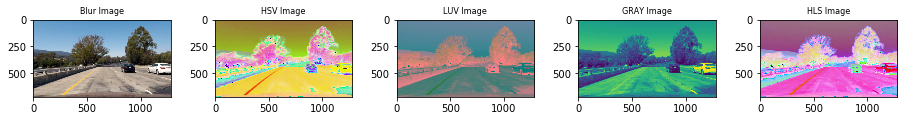

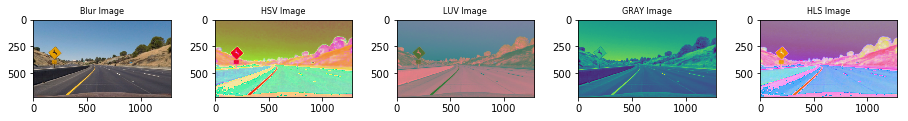

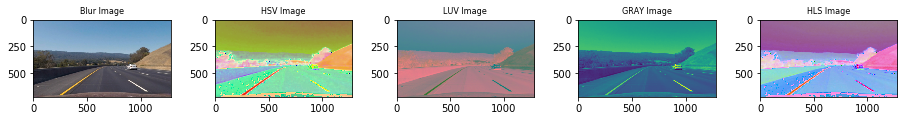

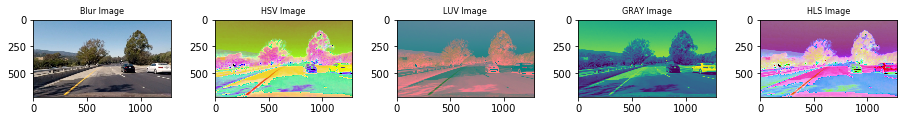

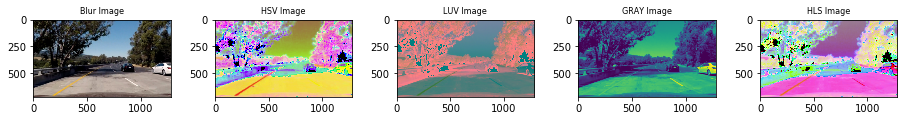

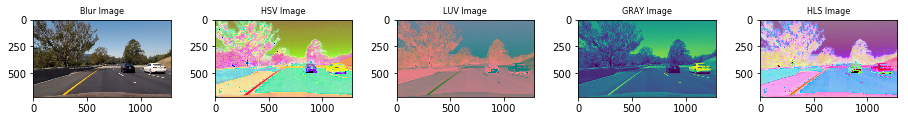

In [10]:
for i in range(6):
    fname = 'test_images/test{}.jpg'.format(i+1)
    image = mpimg.imread(fname)
    image = undistort(image, mtx, dist)
    img = gaussianblur(image)
    #test_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    #test_dst = undistort(image, mtx, dist)
    hsv = color_transform(img,cmd = 'HSV')
    luv = color_transform(img,cmd = 'LUV')
    gray = color_transform(img,cmd = 'GRAY')
    hls = color_transform(img,cmd = 'HLS')
    f, (ax1, ax2,ax3, ax4, ax5) = plt.subplots(1, 5, figsize=(12, 18))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Blur Image', fontsize=8)
    ax2.imshow(hsv)
    ax2.set_title('HSV Image', fontsize=8)
    ax3.imshow(luv)
    ax3.set_title('LUV Image', fontsize=8)
    ax4.imshow(gray)
    ax4.set_title('GRAY Image', fontsize=8)
    ax5.imshow(hls)
    ax5.set_title('HLS Image', fontsize=8)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [11]:
def warp(img, src, dst, image_size):
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(img, M, image_size, flags=cv2.INTER_LINEAR)
    Minv = cv2.getPerspectiveTransform(dst, src)
    return warped, M, Minv

In [12]:
def roi(img):
    """center_point = np.uint(image.shape[1]/2)
    y_top = np.uint(image.shape[0]/1.5)
    x_top_left = center_point - .25*np.uint(image.shape[1]/2) + 50
    x_top_right = center_point + .25*np.uint(image.shape[1]/2) - 50
    x_bottom_left = center_point - 1*np.uint(image.shape[1]/2) + 150
    y_bottom_left = np.uint(image.shape[0])
    x_bottom_right = np.uint(image.shape[1]) - 150
    corners = np.float32([[255, 680], [585, 455], [700, 455], [1060, 680]])
    new_top_left = np.array([corners[0, 0], 0])
    new_top_right = np.array([corners[3, 0], 0])
    offset = [50, 0]
    img_size = (image.shape[1], image.shape[0])
    src = np.float32([corners[0], corners[1], corners[2], corners[3]])
    dst = np.float32([corners[0] + offset, new_top_left + offset, new_top_right - offset, corners[3] - offset])
    """
    #Perspective transfomation
    src = np.float32([[585, 450], [200, 720], [1130, 720], [695, 450]])
    dst = np.float32([[320, 0], [320, 720], [960,720], [960, 0]])
    return src, dst

True

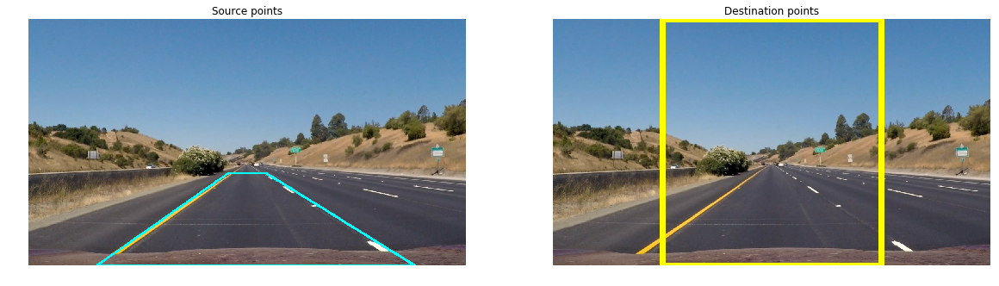

In [13]:
image = cv2.imread("test_images/straight_lines1.jpg")
src, dst = roi(image)
# Plot the chosen source and destination points on the original image
points_image_src = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
points_image_dst = points_image_src.copy()
src_pts = src.reshape((-1, 1, 2)).astype("int32")
cv2.polylines(points_image_src, [src_pts], True, (0, 255, 255), thickness=5)
plt.figure(figsize=(20,10))
plt.subplot(1, 2, 1)
plt.imshow(points_image_src)
plt.title("Source points")
plt.axis("off")
cv2.imwrite("output_images/src.jpg", points_image_src)
dst_pts = dst.reshape((-1, 1, 2)).astype("int32")
cv2.polylines(points_image_dst, [dst_pts], True, (255, 255, 0), thickness=15)
plt.subplot(1, 2, 2)
plt.imshow(points_image_dst)
plt.title("Destination points")
plt.axis("off")
cv2.imwrite("output_images/dst.jpg", points_image_dst)

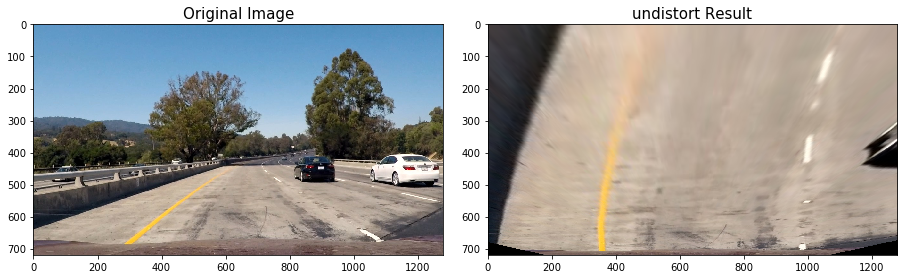

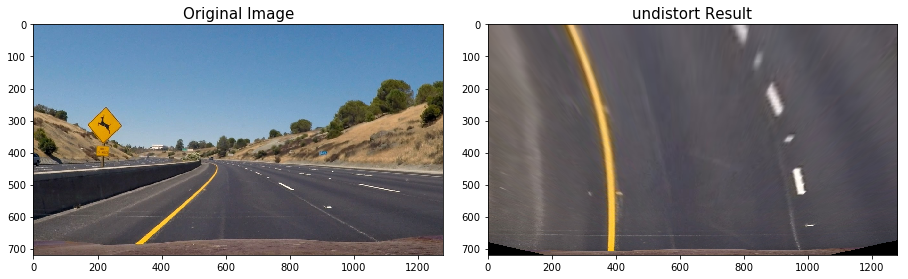

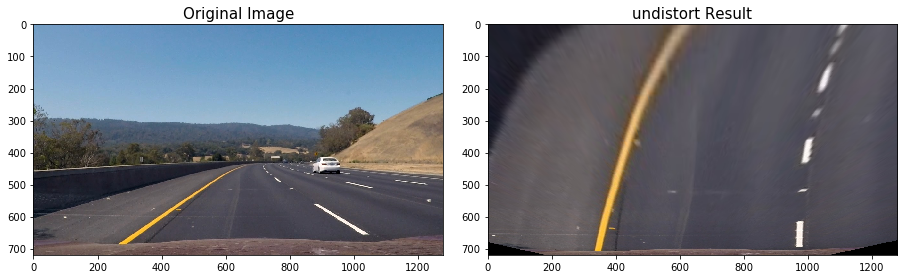

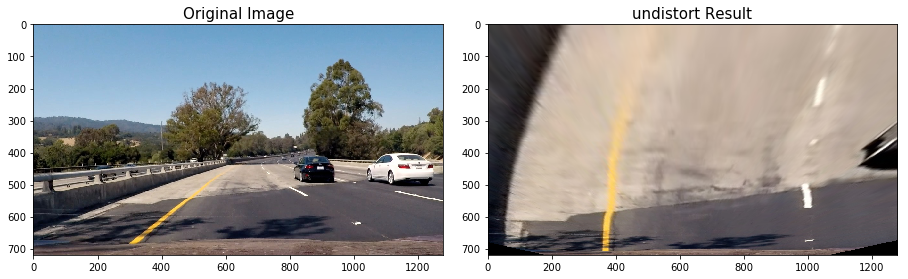

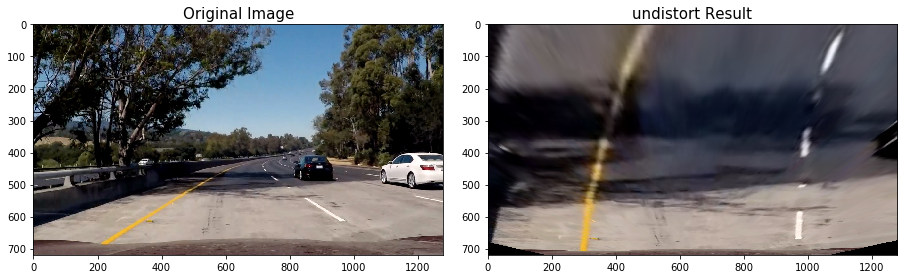

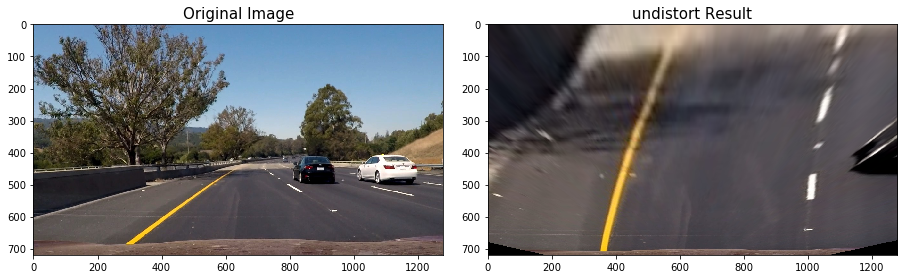

In [14]:
for i in range(6):
    fname = 'test_images/test{}.jpg'.format(i+1)
    image = mpimg.imread(fname)
    #test_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    img_dst = undistort(image, mtx, dist)
    src, dst = roi(img_dst)
    warped, _, _ = warp(image, src, dst, (img_dst.shape[1], img_dst.shape[0]))
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 18))
    f.tight_layout()
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=15)
    ax2.imshow(warped)
    ax2.set_title('undistort Result', fontsize=15)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    warped = cv2.cvtColor(warped, cv2.COLOR_RGB2BGR)
    cv2.imwrite("output_images/warped_output{}.jpg".format(i+1), warped)

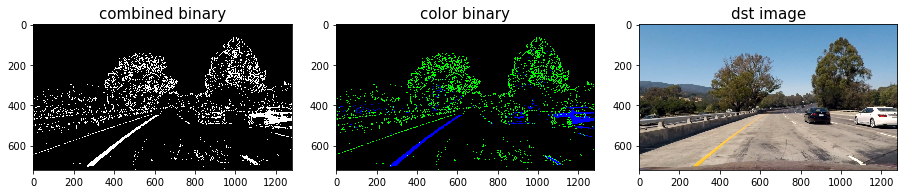

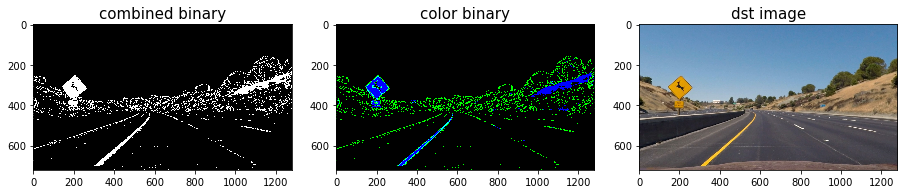

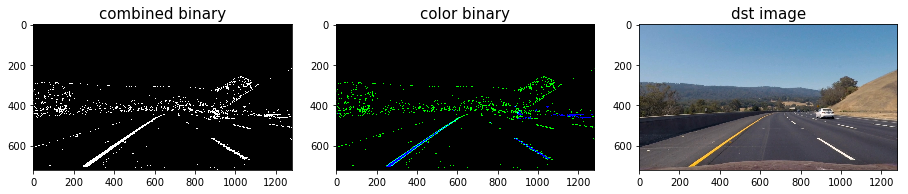

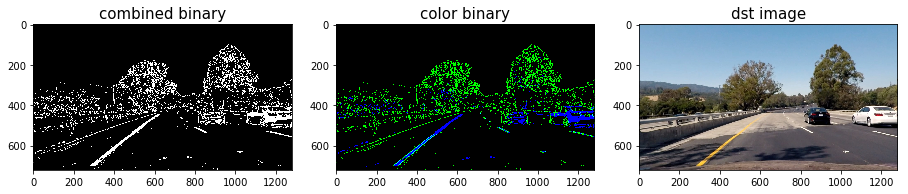

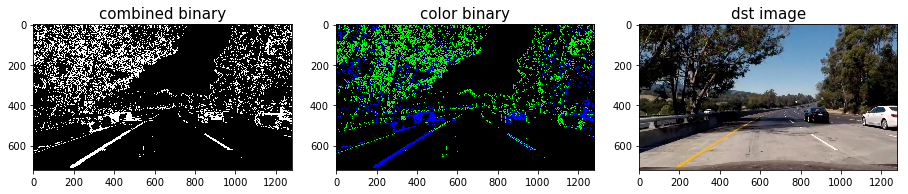

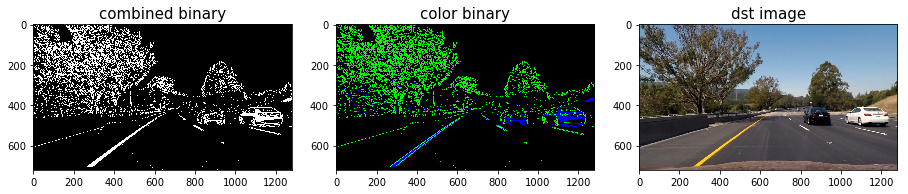

In [15]:
for i in range(6):
    fname = 'test_images/test{}.jpg'.format(i+1)
    img = cv2.imread(fname)
    image = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    #image = mpimg.imread(fname)
    #test_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    img_dst = undistort(image, mtx, dist)
    #src, dst = roi(img_dst)
    #warped, _, _ = warp(image, src, dst, (img_dst.shape[1], img_dst.shape[0]))
    combined_binary, color_binary = binary_image(img_dst)
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 18))
    f.tight_layout()
    ax1.imshow(combined_binary,cmap="gray")
    ax1.set_title('combined binary', fontsize=15)
    ax2.imshow(color_binary)
    ax2.set_title('color binary', fontsize=15)
    ax3.imshow(img_dst)
    ax3.set_title('dst image', fontsize=15)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

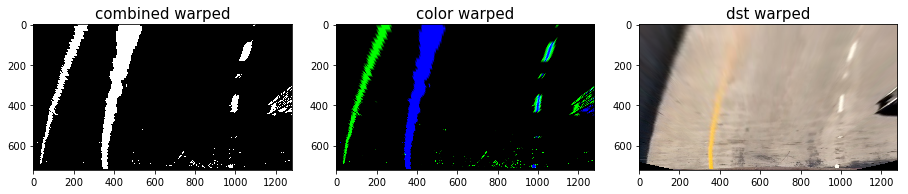

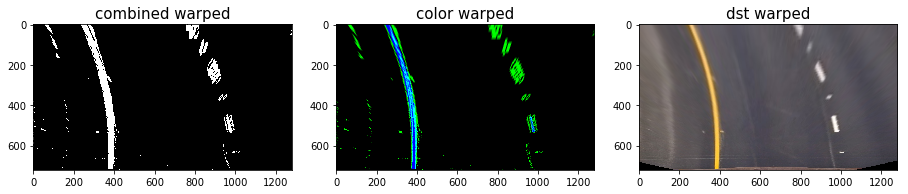

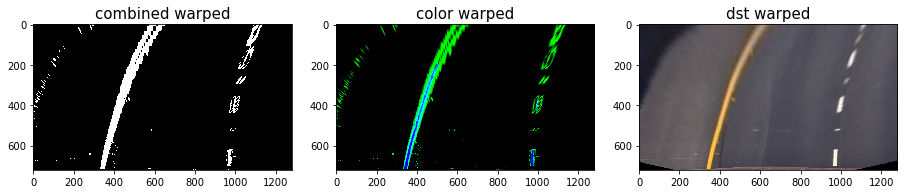

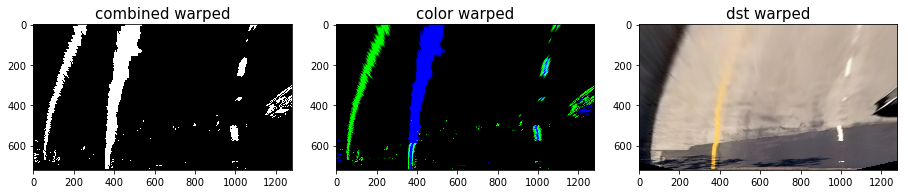

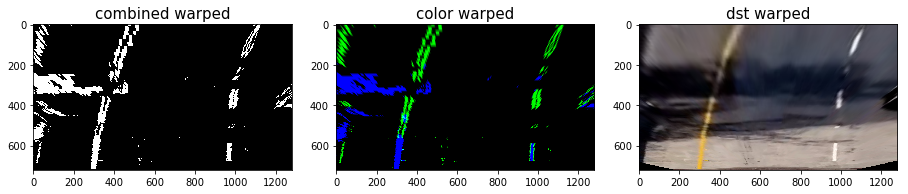

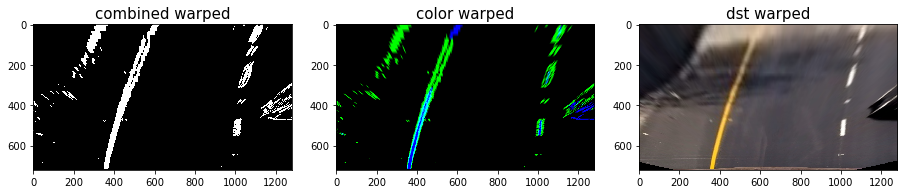

In [16]:
for i in range(6):
    fname = 'test_images/test{}.jpg'.format(i+1)
    img = cv2.imread(fname)
    image = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    #image = mpimg.imread(fname)
    #test_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    img_dst = undistort(image, mtx, dist)
    #src, dst = roi(img_dst)
    #warped, _, _ = warp(image, src, dst, (img_dst.shape[1], img_dst.shape[0]))
    combined_binary, color_binary = binary_image(img_dst)
    src, dst = roi(combined_binary)
    warped_combined, _, _ = warp(combined_binary, src, dst, (combined_binary.shape[1], combined_binary.shape[0]))
    src, dst = roi(color_binary)
    warped_color, _, _ = warp(color_binary, src, dst, (color_binary.shape[1], color_binary.shape[0]))
    src, dst = roi(img_dst)
    warped_dst, _, _ = warp(img_dst, src, dst, (img_dst.shape[1], img_dst.shape[0]))
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 18))
    f.tight_layout()
    ax1.imshow(warped_combined,cmap="gray")
    ax1.set_title('combined warped', fontsize=15)
    ax2.imshow(warped_color)
    ax2.set_title('color warped', fontsize=15)
    ax3.imshow(warped_dst)
    ax3.set_title('dst warped', fontsize=15)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [17]:
def dt_lane_lines(binary_warped):
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255

    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    
    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img, (win_xleft_low,win_y_low), (win_xleft_high,win_y_high), (0,255,0), 2)
        cv2.rectangle(out_img, (win_xright_low,win_y_low), (win_xright_high,win_y_high), (0,255,0), 2)
        
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
        
    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
    
    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    # Fit a second order polynomial to each
    if len(leftx) == 0:
        left_fit =[]
    else:
        left_fit = np.polyfit(lefty, leftx, 2)
    if len(rightx) == 0:
        right_fit =[]
    else:
        right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    return left_fitx, right_fitx, ploty, left_fit, right_fit, leftx, lefty, rightx, righty, out_img

In [18]:
def gt_curvature(ploty, left_fit,right_fit, image_size):
    
    y_eval = np.max(ploty)//2
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    left_curverad = ((1 + (2*left_fit[0]*y_eval*ym_per_pix + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    right_curverad = ((1 + (2*right_fit[0]*y_eval*ym_per_pix + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
    center = (((left_fit[0]*720**2+left_fit[1]*720+left_fit[2]) +(right_fit[0]*720**2+right_fit[1]*720+right_fit[2]) ) /2 - 640)*xm_per_pix
    #print(center)
    return left_curverad, right_curverad, center

In [27]:
def gt_curvature2(leftx, lefty, rightx, righty, ploty, image_size):
    y_eval = np.max(ploty)
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # calculate the lane deviation of the vehicle
    scene_height = image_size[0] * ym_per_pix
    scene_width = image_size[1] * xm_per_pix
    
    left_intercept = left_fit_cr[0] * scene_height ** 2 + left_fit_cr[1] * scene_height + left_fit_cr[2]
    right_intercept = right_fit_cr[0] * scene_height ** 2 + right_fit_cr[1] * scene_height + right_fit_cr[2]
    calculated_center = (left_intercept + right_intercept) / 2.0
    
    lane_deviation = (calculated_center - scene_width / 2.0)
    
    return left_curverad, right_curverad, lane_deviation

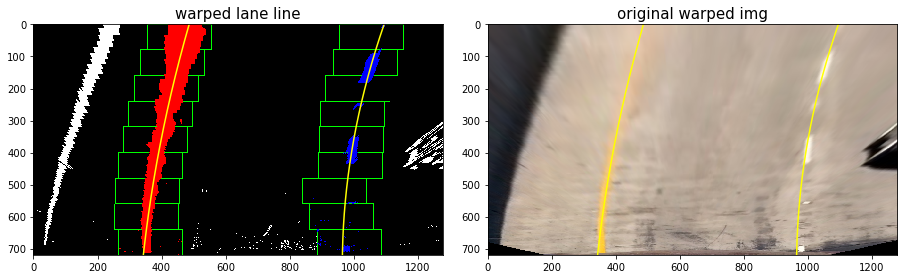

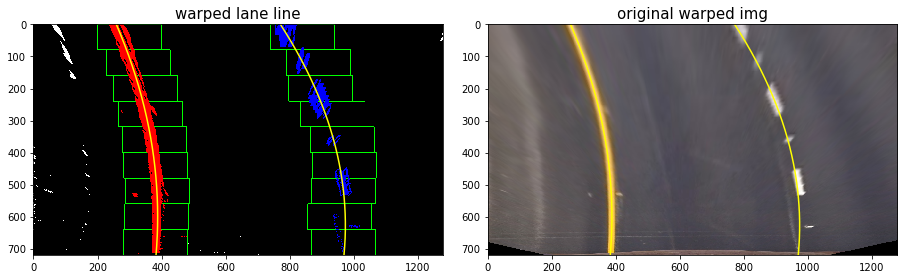

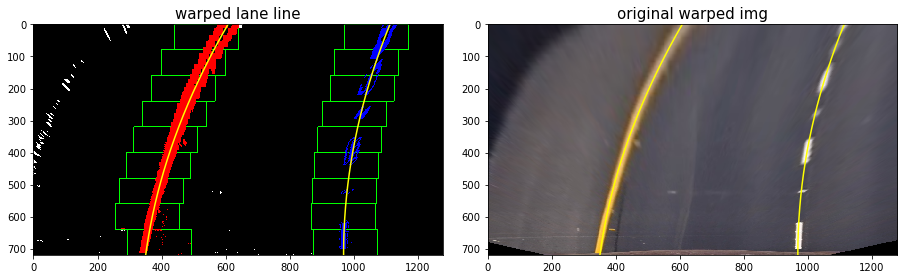

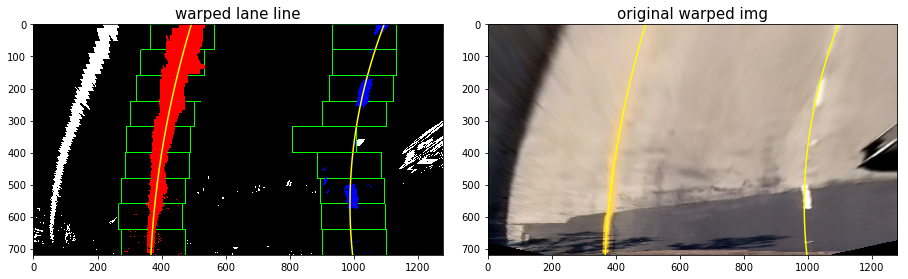

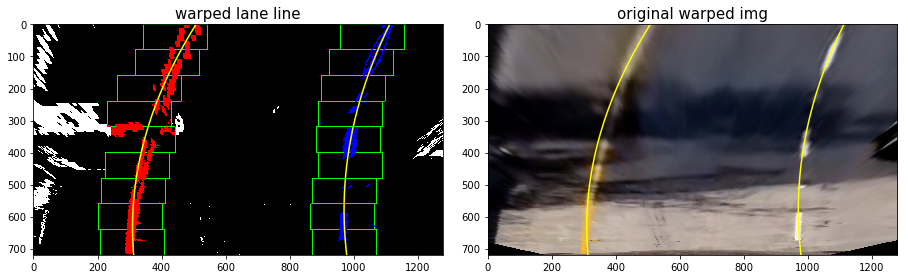

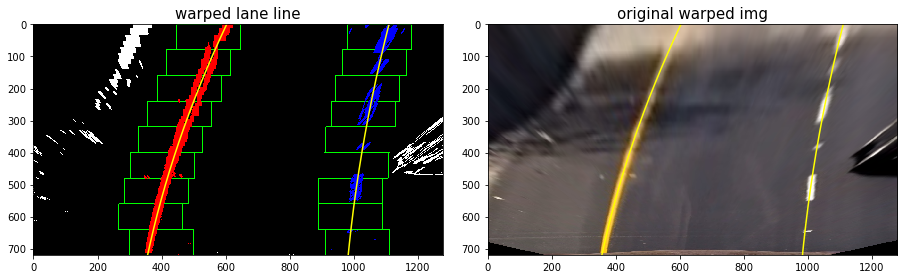

In [19]:
for i in range(6):
    fname = 'test_images/test{}.jpg'.format(i+1)
    img = cv2.imread(fname)
    image = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    #image = mpimg.imread(fname)
    #test_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    img_dst = undistort(image, mtx, dist)
    #src, dst = roi(img_dst)
    #warped, _, _ = warp(image, src, dst, (img_dst.shape[1], img_dst.shape[0]))
    combined_binary, color_binary = binary_image(img_dst)
    src, dst = roi(combined_binary)
    warped_combined, _, _ = warp(combined_binary, src, dst, (combined_binary.shape[1], combined_binary.shape[0]))
    com_left_fitx, com_right_fitx, com_ploty, com_left_fit, com_right_fit, com_leftx, com_lefty, com_rightx, com_righty,com_out_img = dt_lane_lines(warped_combined)
    src, dst = roi(color_binary)
    src, dst = roi(img_dst)
    warped_dst, _, _ = warp(img_dst, src, dst, (img_dst.shape[1], img_dst.shape[0]))
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 18))
    f.tight_layout()
    ax1.imshow(com_out_img,cmap="gray")
    ax1.plot(com_left_fitx, com_ploty, color='yellow')
    ax1.plot(com_right_fitx, com_ploty, color='yellow')
    ax1.set_title('warped lane line', fontsize=15)
    cv2.imwrite("output_images/warped_lane_line{}.jpg".format(i+1), com_out_img)
    ax2.imshow(warped_dst)
    ax2.plot(com_left_fitx, com_ploty, color='yellow')
    ax2.plot(com_right_fitx, com_ploty, color='yellow')
    ax2.set_title('original warped img', fontsize=15)
    cv2.imwrite("output_images/warped_output_original{}.jpg".format(i+1), warped_dst)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [20]:
def draw_lanes_back(binary_warped, undistorted_img, Minv, left_fit, right_fit, ploty, left_radius, right_radius, lane_deviation):
    # Create a blank image to draw the lines on
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2+left_fit[1]*ploty+left_fit[2]
    right_fitx = right_fit[0]*ploty**2+right_fit[1]*ploty+right_fit[2] 
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    #print(pts_left)
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    #print(pts_right)
    pts = np.hstack((pts_left, pts_right))
    
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0, 255, 0))
    
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (undistorted_img.shape[1], undistorted_img.shape[0])) 
    
    # Combine the result with the original image
    result = cv2.addWeighted(undistorted_img, 1, newwarp, 0.3, 0)
    curvature_text = "Curvature: Left = " + str(np.round(left_radius, 2)) + ", Right = " + str(np.round(right_radius, 2)) 
    font = cv2.FONT_HERSHEY_COMPLEX    
    cv2.putText(result, curvature_text, (30, 60), font, 1, (0,255,0), 2)
    lane_deviation = np.array(lane_deviation)
    #deviation_text = "Lane deviation from center = {:.2f} m".format(lane_deviation)
    deviation_text = ('lane deviation from center = {:.2f}m'.format(np.float(lane_deviation)))
    #print(lane_deviation)
    font = cv2.FONT_HERSHEY_COMPLEX    
    cv2.putText(result, deviation_text, (30, 90), font, 1, (0,255,0), 2)
    return result

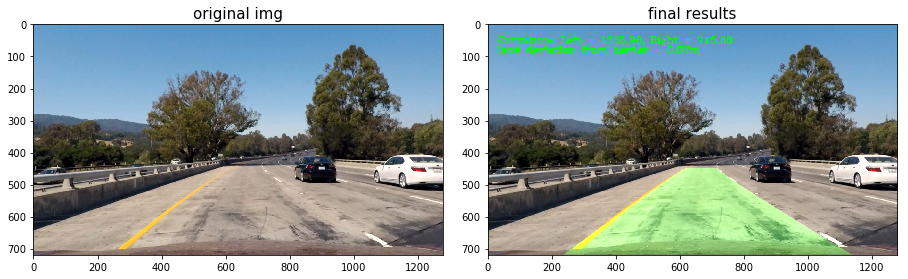

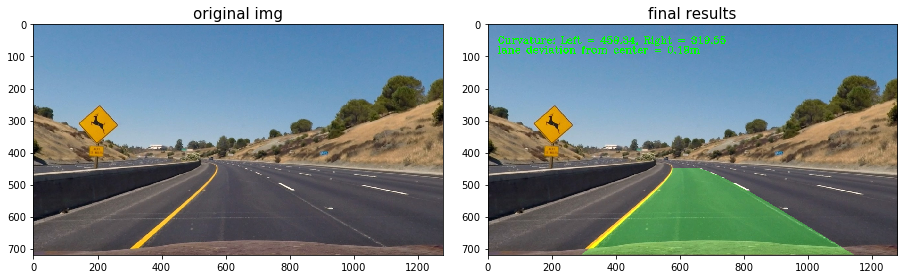

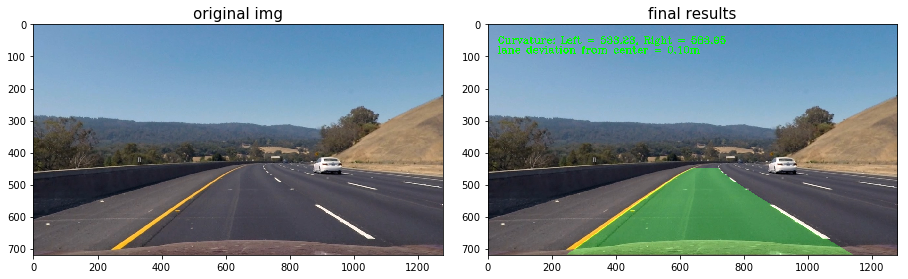

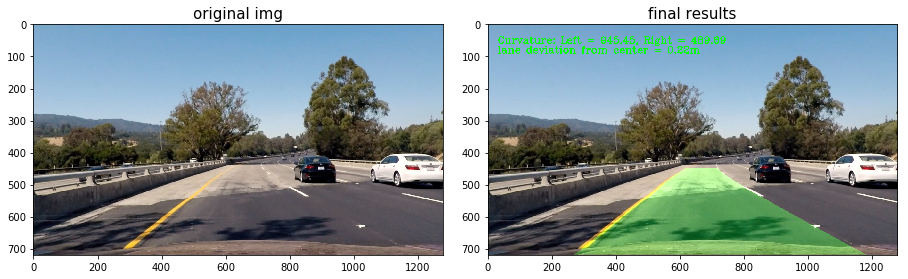

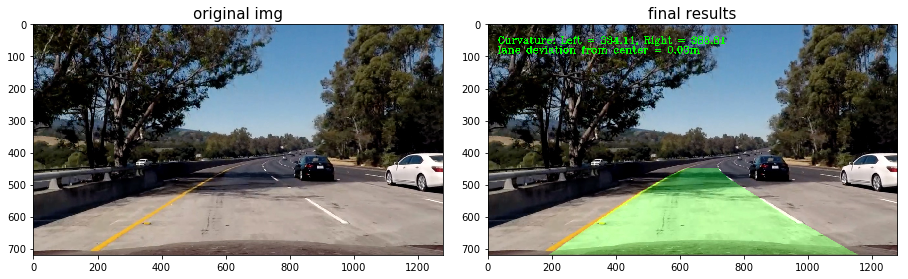

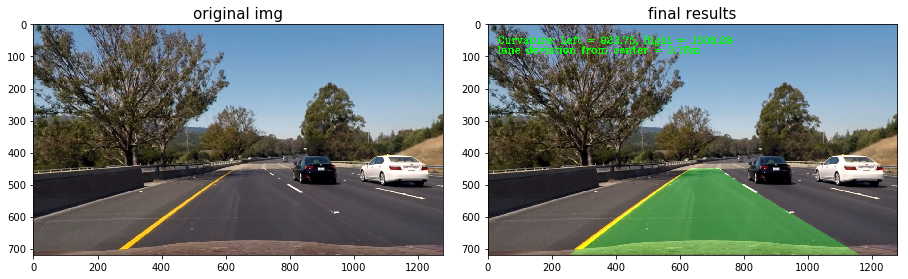

In [31]:
for i in range(6):
    fname = 'test_images/test{}.jpg'.format(i+1)
    img = cv2.imread(fname)
    image = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    #image = mpimg.imread(fname)
    #test_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    img_dst = undistort(image, mtx, dist)
    #src, dst = roi(img_dst)
    #warped, _, _ = warp(image, src, dst, (img_dst.shape[1], img_dst.shape[0]))
    combined_binary, color_binary = binary_image(img_dst)
    src, dst = roi(combined_binary)
    warped_combined, M, Minv = warp(combined_binary, src, dst, (combined_binary.shape[1], combined_binary.shape[0]))
    com_left_fitx, com_right_fitx, com_ploty, com_left_fit, com_right_fit, com_leftx, com_lefty, com_rightx, com_righty,com_out_img = dt_lane_lines(warped_combined)
    #left_curverad, right_curverad, lane_deviation = gt_curvature(com_leftx, com_lefty, com_rightx, com_righty,com_ploty,warped_combined.shape)
    #left_curverad, right_curverad, lane_deviation = gt_curvature(com_ploty, com_left_fit, com_right_fit, combined_binary)
    left_curverad, right_curverad, lane_deviation = gt_curvature2(com_leftx, com_lefty, com_rightx, com_righty, com_ploty, warped_combined.shape)

    result = draw_lanes_back(combined_binary, img_dst, Minv, com_left_fit, com_right_fit, com_ploty, left_curverad, right_curverad, lane_deviation)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 18))
    f.tight_layout()
    ax1.imshow(img_dst)
    ax1.set_title('original img', fontsize=15)
    #cv2.imwrite("output_images/warped_lane_line{}.jpg".format(i+1), com_out_img)
    ax2.imshow(result)
    ax2.set_title('final results', fontsize=15)
    cv2.imwrite("output_images/final_results{}.jpg".format(i+1), result)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [22]:
def sanity_check(left_fit, right_fit, minSlope, maxSlope):
    #check if left and right fits exists
    #Calculates the tangent between left and right in two points
    #and check with threshold value
    # meters per pixel in x dimension
    xm_per_pix = 3.7/700 
    if len(left_fit) ==0 or len(right_fit) == 0:
        status = False
        d0=0
        d1=0
        #Previous fitlines routine returns empty list to them if not finds
    else:
        #slope
        L_0 = 2*left_fit[0]*460+left_fit[1]
        R_0 = 2*right_fit[0]*460+right_fit[1]
        d0 =  np.abs(L_0-R_0)
        L_1 = 2*left_fit[0]*720+left_fit[1]
        R_1 = 2*right_fit[0]*720+right_fit[1]
        d1 =  np.abs(L_1-R_1)
        if d0>= minSlope and d0<= maxSlope and d1>= minSlope and d1<= maxSlope:
            status = True
        else:
            status = False
            
    return(status, d0, d1)

In [28]:
global counter
counter=0
ref_left =np.array([-0.0001,0,400])
ref_right=np.array([-0.0001,0,1000])   
left_fit =np.array([-0.0001,0,400])
right_fit=np.array([-0.0001,0,1000])  

In [29]:
def process_image(image):
    global counter
    global ref_left 
    global ref_right
    global left_fit
    global right_fit
    img_dst = undistort(image, mtx, dist)
    combined_binary, color_binary = binary_image(img_dst)
    src, dst = roi(combined_binary)
    warped_combined, M, Minv = warp(combined_binary, src, dst, (combined_binary.shape[1], combined_binary.shape[0]))
    com_left_fitx, com_right_fitx, com_ploty, left_fit, right_fit, com_leftx, com_lefty, com_rightx, com_righty, com_out_img = dt_lane_lines(warped_combined)
    #left_curverad, right_curverad, lane_deviation = gt_curvature(com_ploty, left_fit, right_fit, combined_binary)
    left_curverad, right_curverad, lane_deviation = gt_curvature2(com_leftx, com_lefty, com_rightx, com_righty, com_ploty, warped_combined.shape)
    status_sanity, d0, d1 =sanity_check(left_fit, right_fit, 0., .35)
    if status_sanity  == True:        
        #Save as last reliable fit
        ref_left, ref_right = left_fit, right_fit        
        counter+=1
    else:#use previous one
        left_fit, right_fit = ref_left, ref_right
    result = draw_lanes_back(combined_binary, img_dst, Minv, left_fit, right_fit, com_ploty, left_curverad, right_curverad, lane_deviation)
    return result

In [30]:
video_output = "output_images/project_video_output.mp4"
clip1 = VideoFileClip("project_video.mp4")
clip1_output = clip1.fl_image(process_image)
%time clip1_output.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video output_images/project_video_output.mp4
[MoviePy] Writing video output_images/project_video_output.mp4


100%|█████████▉| 1260/1261 [02:40<00:00,  7.69it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_images/project_video_output.mp4 

CPU times: user 7min 23s, sys: 1.34 s, total: 7min 24s
Wall time: 2min 40s


In [26]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(video_output))